# Tutorial 10 - Clustering

### Lecture and Tutorial Learning Goals:

After completing this week's lecture and tutorial work, you will be able to:

* Describe a case where clustering would be an appropriate tool, and what insight it would bring from the data.
* Explain the K-means clustering algorithm.
* Interpret the output of a K-means cluster analysis.
* Perform K-means clustering in R
* Visualize the output of K-means clustering in R using a coloured scatter plot 
* Identify when it is necessary to scale variables before clustering and do this using R
* Use the elbow method to choose the number of clusters for k-means
* Describe advantages, limitations and assumptions of the kmeans clustering algorithm.

This worksheet covers parts of [the Clustering chapter](https://datasciencebook.ca/clustering.html) of the online textbook. You should read this chapter before attempting the worksheet.

In [1]:
### Run this cell before continuing.
library(tidyverse)
library(tidymodels)
library(tidyclust)
library(repr)
library(GGally)
options(repr.matrix.max.rows = 6)
source('tests.R')
source("cleanup.R")

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.3     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.1.1 ──

✔ broom        1.0.5     ✔ rsample      1.2.0
✔ dials        1.2.0     ✔ tune         1.1.2
✔ infer        1.0.4     ✔ workflows    1.1.3
✔ modeldata    1.2.0     ✔ workflowsets 1.0.1
✔ parsnip      1.1.1     ✔ yardstick    1.2.0
✔ recipes      1.0.8     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filt

# 1. Pokemon

We will be working with the Pokemon dataset from Kaggle, which can be found [here.](https://www.kaggle.com/abcsds/pokemon)
This dataset compiles the statistics on 721 Pokemon. The information in this dataset includes Pokemon name, type, health points, attack strength, defensive strength, speed points etc. These are values that apply to a Pokemon's abilities (higher values are better). We are interested in seeing if there are any sub-groups/clusters of pokemon based on these statistics. And if so, how many sub-groups/clusters there are.

![](https://media.giphy.com/media/3oEduV4SOS9mmmIOkw/giphy.gif)

Source: https://media.giphy.com/media/3oEduV4SOS9mmmIOkw/giphy.gif


**Question 1.0**
<br> {points: 1}

Use `read_csv` to load `pokemon.csv` from the `data/` folder. 

*Assign your answer to an object called `pokemon_full`.*

In [2]:
# your code here
pokemon_full <-  read_csv("data/pokemon.csv")


pokemon_full

Rows: 800 Columns: 13
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (3): Name, Type 1, Type 2
dbl (9): #, Total, HP, Attack, Defense, Sp. Atk, Sp. Def, Speed, Generation
lgl (1): Legendary

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>
1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,FALSE
2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,FALSE
3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,FALSE
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
720,HoopaHoopa Confined,Psychic,Ghost,600,80,110,60,150,130,70,6,TRUE
720,HoopaHoopa Unbound,Psychic,Dark,680,80,160,60,170,130,80,6,TRUE
721,Volcanion,Fire,Water,600,80,110,120,130,90,70,6,TRUE


In [3]:
test_1.0()

Test passed 🥳
Test passed 🥇
Test passed 😸
Test passed 🎉
[1] "Success!"


**Question 1.1**
<br> {points: 1}

To start exploring the Pokemon data, create a scatter plot matrix (or pairplot) using `ggpairs`. The plot should only contain the columns `Total` to `Speed` from `pm_data`. You can check the data wrangling chapter in the textbook to recall how to select a range of columns using `select` with `:`.

*Assign your answer to an object called `pokemon_pairs`. Make sure to set a suitable size for the plot.*

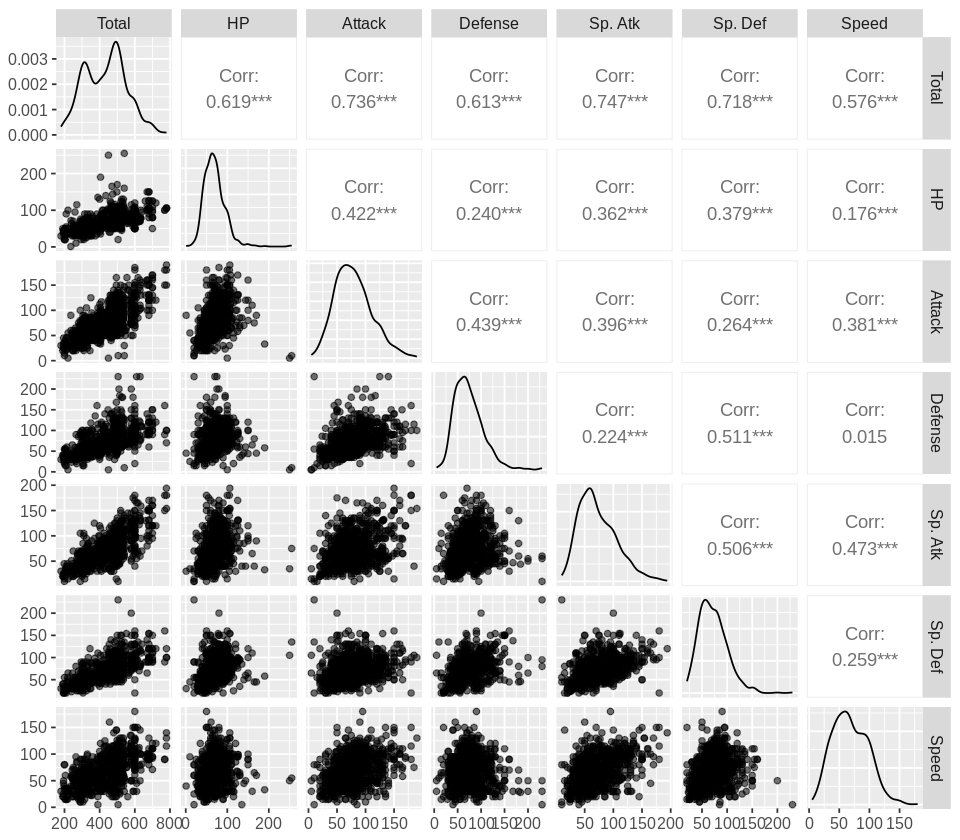

In [4]:
options(repr.plot.width = 8, repr.plot.height = 7)

 pokemon_pairs <- pokemon_full |> select(Total:Speed) |>
     ggpairs(aes(alpha = 0.05)) +
     theme(text = element_text(size = 12))


pokemon_pairs

In [5]:
test_1.1()

Test passed 🌈
Test passed 🥇
Test passed 🌈
Test passed 🥇
[1] "Success!"


**Question 1.2** 
<br> {points: 1}

From the pairplot above, it does not look like the pokemon are separated into clear groups in any of the pairwise variable scatterplots. Here, we will continue exploring the relationship between `Speed` and `Defense` and see what happens if we try to cluster the data points on these two variables although there are no visually discernable variables in the chart.

First, select the columns `Speed` and `Defense`, creating a new dataframe with only those columns.

*Assign your answer to an object named `pokemon`.*

In [6]:
# your code here

pokemon <- pokemon_full |>
    select(Speed, Defense)

In [7]:
test_1.2()

Test passed 🥳
Test passed 🎉
[1] "Success!"


**Question 1.3**
<br> {points: 1}

Next, create a scatter plot of only these two variables so that we can look close at their relationship. Put the `Speed` variable on the x-axis, and the `Defense` variable on the y-axis.

*Assign your plot to an object called `pokemon_scatter`. Don't forget to do everything needed to make an effective visualization, including setting an appropriate `alpha` value of the points.*

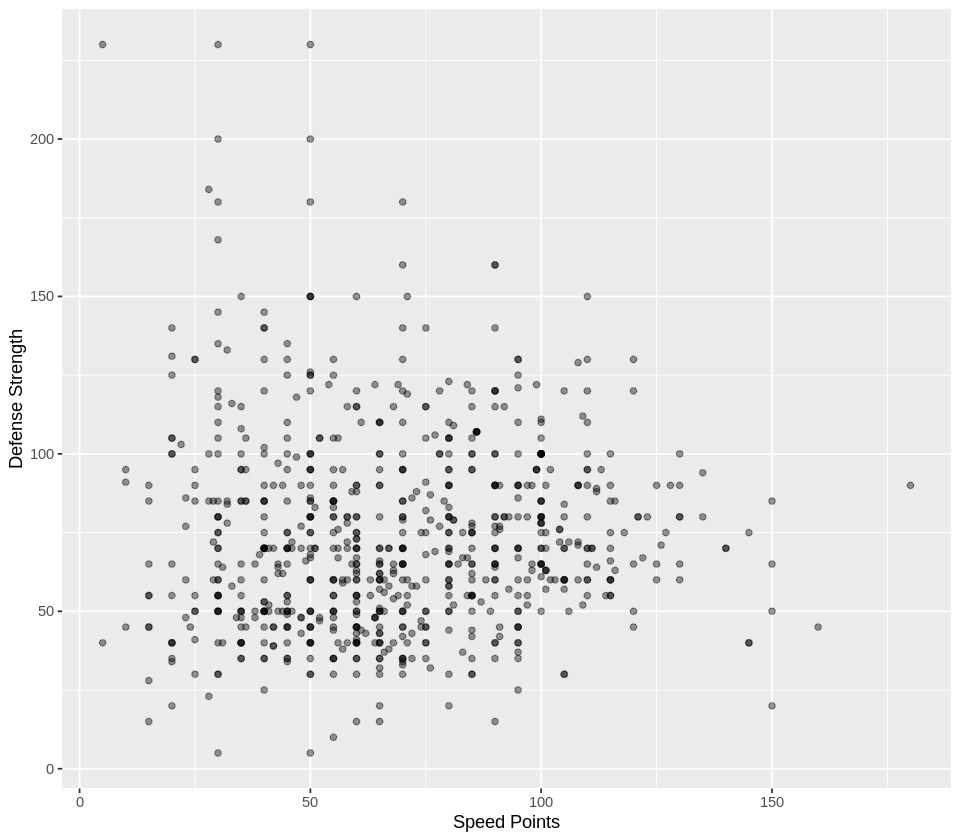

In [8]:
# your code here
pokemon_scatter <- pokemon |>
    ggplot(aes(x = Speed, y = Defense)) +
    geom_point(alpha = 0.4) +
    xlab("Speed Points") +
    ylab("Defense Strength") 

pokemon_scatter

In [9]:
test_1.3()

Test passed 🎊
Test passed 😀
Test passed 🎉
Test passed 😸
Test passed 🎊
[1] "Success!"


**Question 1.4.1** 
<br> {points: 3}

The chart above confirms what we saw in the pairplot; there doesn't seem to be visually distinct clusters of points in these two dimensions. Could it still be informative to run clustering with this data? Let's find out by using K-Means to cluster the Pokemon based on their `Speed` and `Defense`.

So far when using K-Means, we have scaled our input features. Will it matter much for our clustering if we scale our variables for the pokemon data? Is there any argument against scaling here?

If we don’t scale the features, the features with larger values will dominate the distance metric and the clustering results may be biased towards those features.

**Question 1.4.2**
<br> {points: 1}

Now, let's use K-means to cluster the Pokemon based on their `Speed` and `Defense` variables.
- Create a recipe named `pokemon_recipe` that standardizes the data
- Create a model specification named `pokemon_spec` for K-means clustering with 4 clusters. 
- Fit the model using a `tidymodels` workflow; call the output of the `fit()` function `pokemon_clustering`.

*Assign your answers to objects called `pokemon_recipe`, `pokemon_spec`, and `pokemon_clustering`.*

**Note:** We set the random seed here because K-means initializes observations to random clusters.

In [10]:
#DON'T CHANGE THE SEED VALUE BELOW!
set.seed(2019)
pokemon_recipe <- recipe( ~ . , data = pokemon) |> 
        step_scale(all_predictors()) |>
        step_center(all_predictors())

pokemon_spec <- k_means(num_clusters = 4) |>
        set_engine("stats")

pokemon_clustering <- workflow() |>
    add_recipe(pokemon_recipe) |>
    add_model(pokemon_spec) |>
    fit(data = pokemon)


pokemon_clustering

══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: k_means()

── Preprocessor ────────────────────────────────────────────────────────────────
2 Recipe Steps

• step_scale()
• step_center()

── Model ───────────────────────────────────────────────────────────────────────
K-means clustering with 4 clusters of sizes 202, 114, 139, 345

Cluster means:
       Speed    Defense
1  1.1566773 -0.3181717
2 -0.9769812  1.3994566
3  0.6296539  0.9144968
4 -0.6081010 -0.6445867

Clustering vector:
  [1] 4 4 3 3 4 1 1 3 1 4 4 3 3 4 4 4 4 4 4 1 4 4 1 1 4 1 4 1 4 1 1 1 2 3 4 4 3
 [38] 4 4 1 4 4 4 1 4 4 4 1 4 4 4 4 4 4 1 1 1 1 1 4 1 4 1 4 1 1 1 3 1 1 1 1 4 4
 [75] 4 4 4 4 4 1 2 2 2 1 1 4 2 2 4 3 4 4 1 4 3 4 4 2 2 4 1 1 1 2 4 4 2 3 1 1 4
[112] 4 2 2 1 3 4 2 2 2 2 4 2 1 3 4 3 4 4 1 1 1 1 1 1 1 3 3 3 1 3 3 4 4 4 4 1 4
[149] 4 2 2 2 3 1 1 4 3 1 3 4 4 3 1 3 1 3 4 4 3 4 1 1 4 4 3 4 1 4 4 4 1 4 4 1 4
[186] 4 4 4 4 4 2 4 1 4 4 4 2 2 4 4 2 4 4 1 1 1 4 4

In [11]:
test_1.4.2()

Test passed 🎉
Test passed 😀
Test passed 😸
Test passed 🎊
Test passed 🎉
Test passed 🎉
Test passed 🎊
Test passed 😸
Test passed 🌈
Test passed 🎊
Test passed 🥇
Test passed 😸
[1] "Success!"


**Question 1.5**
<br> {points: 1}

Let's visualize the clusters we built in `pokemon_clustering`. Use the `augment` function and create a coloured scatter plot of `Speed` (x-axis) vs `Defense` (y-axis) with the points coloured by their cluster assignment. 

Name this plot `pokemon_clustering_plot`.

Speed,Defense,.pred_cluster
<dbl>,<dbl>,<fct>
45,49,Cluster_1
60,63,Cluster_1
80,83,Cluster_2
⋮,⋮,⋮
70,60,Cluster_1
80,60,Cluster_3
70,120,Cluster_2


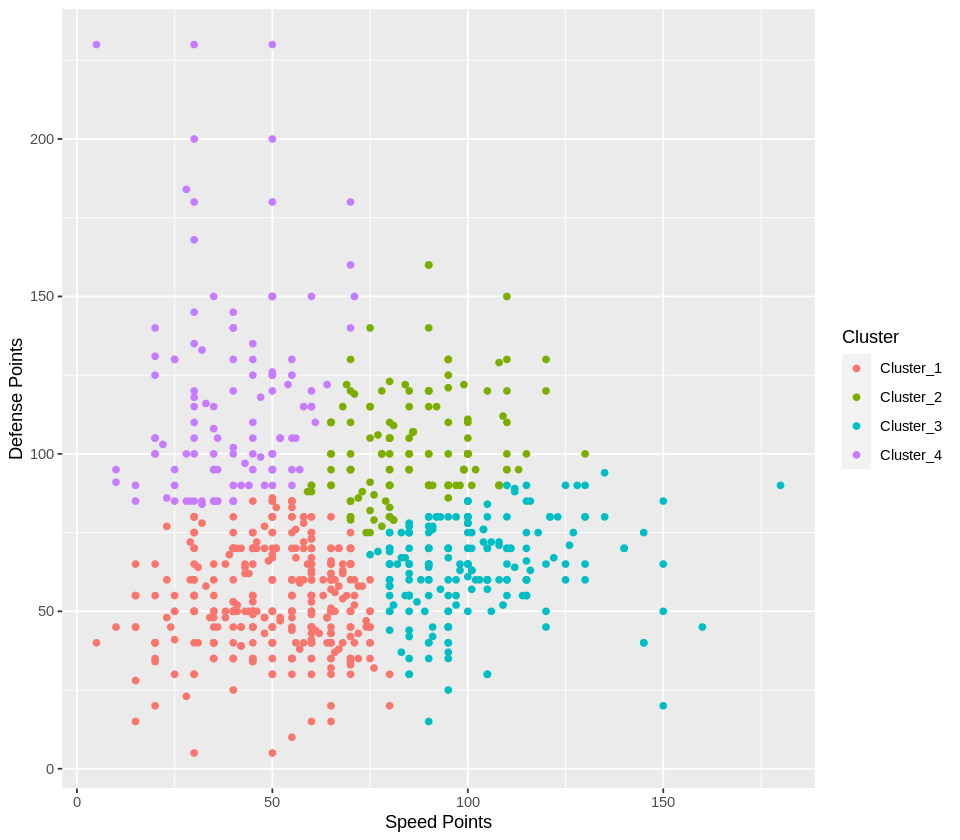

In [12]:
# your code here
labelled_pokemon <- augment(pokemon_clustering, pokemon)
labelled_pokemon

pokemon_clustering_plot <- labelled_pokemon |>
    ggplot(aes(x = Speed, y = Defense, color = .pred_cluster)) +
    geom_point() +
    xlab("Speed Points") +
    ylab("Defense Points") +
    labs(colour = "Cluster")

pokemon_clustering_plot

In [13]:
test_1.5()

Test passed 🌈
Test passed 🥇
Test passed 🎊
Test passed 🎊
Test passed 😀
[1] "Success!"


**Question 1.6**
<br> {points: 3}

Below you can see multiple initializations of k-means with different seeds for `K = 4`. Can you explain what is happening and how we can mitigate this in the `kmeans` function?

![](imgs/multiple_initializations.png)

To ensure that you get the clustering with the smallest WSSD you can use the nstart parameter in the kmeans function.

The nstart parameter specifies the number of random starts, each with a different initial configuration of centroids. The algorithm then chooses the clustering with the lowest WSSD among the specified number of random starts.

**Question 1.7**
<br> {points: 1}

We know that comparing how the WSSD varies for multiple values of $K$ is an important step of selecting a suitable clustering model. That's what we will do next!

For this exercise, you will calculate the total within-cluster sum-of-squared distances for $K$ = 1 to $K$ = 10.

1. Create a tibble with the desired values of $K$.
2. Create a new model specification that sets `nstart` to 10 and tells `k_means` you want to tune the number of clusters.
3. Create a new workflow that uses `tune_cluster` to tune the number of clusters
4. Use the `collect_metrics` function to collect the results.
5. Use `filter`, `select`, and `mutate` functions to construct a tibble with two columns named `num_clusters` and `total_WSSD`. Store that tibble in an object named `elbow_stats`.


*Assign your answer to a tibble object named `elbow_stats`. It should have the columns `num_clusters` and `total_WSSD`.*

In [14]:
set.seed(2020) # DO NOT REMOVE

pokemon_ks <- tibble(num_clusters = 1:10)
kmeans_spec_tune <- k_means(num_clusters = tune()) |>
        set_engine("stats", nstart = 10)

kmeans_tuning_stats <- workflow() |>
        add_recipe(pokemon_recipe) |>
        add_model(kmeans_spec_tune) |>
        tune_cluster(resamples = apparent(pokemon), grid = pokemon_ks) |>
        collect_metrics()

elbow_stats <- kmeans_tuning_stats |>
        mutate(total_WSSD = mean) |>
        filter(.metric == "sse_within_total") |>
        select(num_clusters, total_WSSD)

elbow_stats

num_clusters,total_WSSD
<int>,<dbl>
1,1598.0000
2,1031.4596
3,640.4274
⋮,⋮
8,267.6408
9,235.6118
10,214.2753


In [15]:
test_1.7()

Test passed 🎉
Test passed 😀
Test passed 🥇
Test passed 🌈
Test passed 🎉
Test passed 😀
[1] "Success!"


**Question 1.8**
<br> {points: 1}

Let's visualize how WSSD changes for as we vary the value of $K$. To do this, create the elbow plot. Put the within-cluster sum of squares on the y-axis, and the number of clusters on the x-axis.

*Assign your plot to an object called `elbow_plot`*.

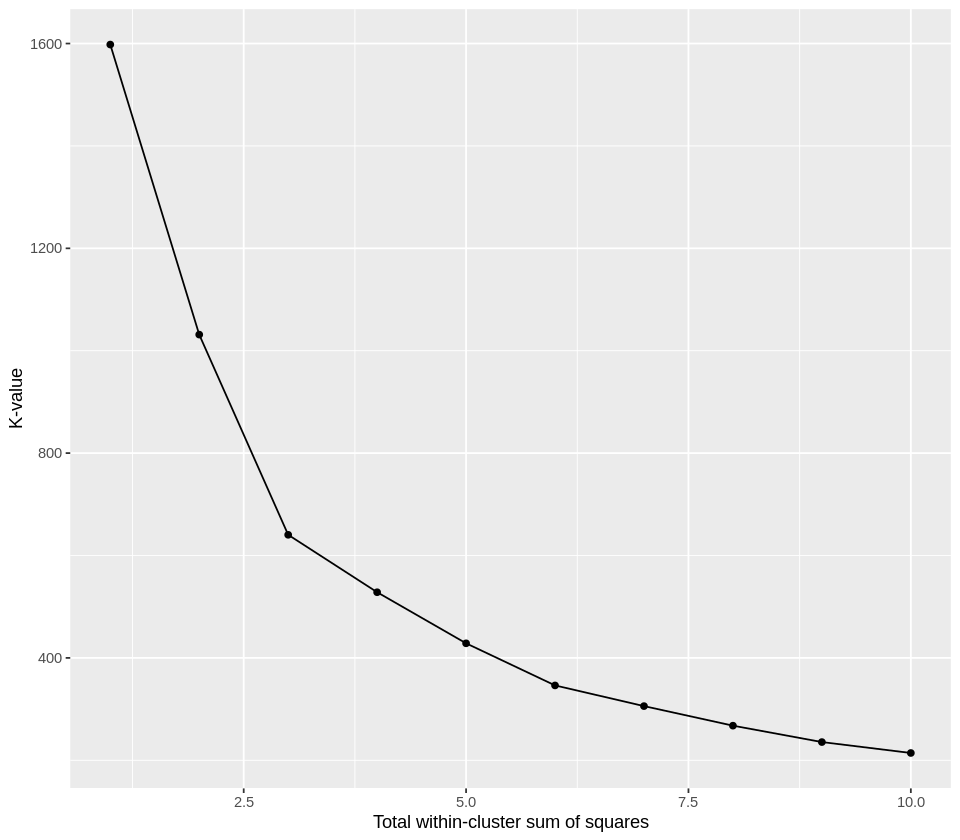

In [16]:
# your code here
elbow_plot <- elbow_stats |>
    ggplot(aes(x = num_clusters, y = total_WSSD)) +
    geom_line() +
    geom_point() +
    ylab("K-value") +
    xlab("Total within-cluster sum of squares")

elbow_plot

In [17]:
test_1.8()

Test passed 🎊
Test passed 😀
Test passed 🎉
Test passed 🎉
Test passed 🎉
[1] "Success!"


**Question 1.9** 
<br> {points: 3}

Based on the elbow plot above, what value of $K$ would you choose? Explain why.

The elbow exists at K = 3, so we would choose K = 3.

**Question 1.10**
<br> {points: 3}

Using the value that you chose for $K$, perform the K-means algorithm, set `nstart = 10` and assign your answer to an object called `pokemon_final_kmeans`. 

Augment the data with the final cluster labels and assign your answer to an object called `pokemon_final_clusters`. 

Finally, create a plot called `pokemon_final_clusters_plot` to visualize the clusters. Include a title, colour the points by the cluster and make sure your axes are human-readable.

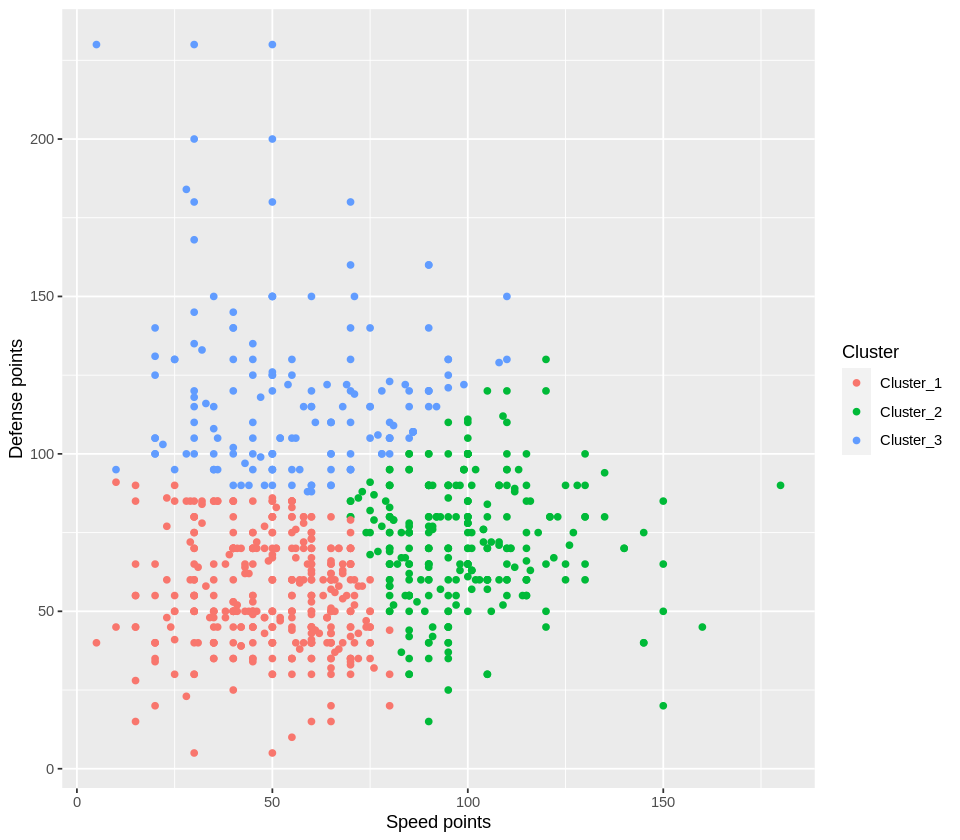

In [18]:
set.seed(2019) # DO NOT REMOVE

pokemon_spec <- k_means(num_clusters = 3) |>
    set_engine("stats", nstart = 10)

pokemon_kmeans <- workflow() |>
    add_recipe(pokemon_recipe) |>
    add_model(pokemon_spec) |>
    fit(data = pokemon) 

pokemon_final_clusters <- augment(pokemon_kmeans, pokemon)

pokemon_final_clusters_plot <- pokemon_final_clusters |>
    ggplot(aes(x = Speed, y = Defense, color = .pred_cluster)) +
    geom_point() +
    labs(x = "Speed points", y = "Defense points", color = "Cluster")

pokemon_final_clusters_plot

In [19]:
test_1.10()

Test passed 🥇
Test passed 😀
Test passed 🌈
Test passed 😀
Test passed 🌈
[1] "Success!"


**Question 1.11** 
<br> {points: 3}

This looks perhaps a bit better than when we used $K=4$ clusters originally, but is it really a lot better? Use this plot and the elbow plot from Question 1.8 to reason about what might be going on here.

If the value of k (the number of clusters) is set too high in k-means clustering, it can lead to overfitting, where the model captures noise rather than meaningful patterns.

# 2. Tourism Reviews

![](https://media.giphy.com/media/xUNd9IsOQ4BSZPfnLG/giphy.gif)
Source: https://media.giphy.com/media/xUNd9IsOQ4BSZPfnLG/giphy.gif

The Ministry of Land, Infrastructure, Transport and Tourism of Japan is interested in knowing the type of tourists that visit East Asia. They know the [majority of their visitors come from this region](https://statistics.jnto.go.jp/en/graph/) and would like to stay competitive in the region to keep growing the tourism industry. For this, they have hired us to perform segmentation of the tourists. A [dataset from TripAdvisor](https://archive.ics.uci.edu/ml/datasets/Travel+Reviews) has been scraped and it's provided to you.

This dataset contains the following variables:

- User ID : Unique user id 
- Category 1 : Average user feedback on art galleries 
- Category 2 : Average user feedback on dance clubs 
- Category 3 : Average user feedback on juice bars 
- Category 4 : Average user feedback on restaurants 
- Category 5 : Average user feedback on museums 
- Category 6 : Average user feedback on resorts 
- Category 7 : Average user feedback on parks/picnic spots 
- Category 8 : Average user feedback on beaches 
- Category 9 : Average user feedback on theaters 
- Category 10 : Average user feedback on religious institutions

**Question 2.0**
<br> {points: 3}

Load the data set from https://archive.ics.uci.edu/ml/machine-learning-databases/00484/tripadvisor_review.csv and clean it so that only the Category # columns are in the data frame (i.e., remove the `User ID` column). 

Assign your answer to an object called `clean_reviews`.

In [20]:
# your code here
url <- "http://archive.ics.uci.edu/ml/machine-learning-databases/00484/tripadvisor_review.csv"

clean_reviews <- read_csv(url) |>
    select(-"User ID")

clean_reviews

Rows: 980 Columns: 11
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (1): User ID
dbl (10): Category 1, Category 2, Category 3, Category 4, Category 5, Catego...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.93,1.8,2.29,0.62,0.80,2.42,3.19,2.79,1.82,2.42
1.02,2.2,2.66,0.64,1.42,3.18,3.21,2.63,1.86,2.32
1.22,0.8,0.54,0.53,0.24,1.54,3.18,2.80,1.31,2.50
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
0.61,1.32,0.67,0.43,1.30,1.78,3.17,2.81,1.34,3.02
0.93,0.20,0.13,0.43,0.30,0.40,3.18,2.98,1.12,2.46
0.93,0.56,1.13,0.51,1.34,2.36,3.18,2.87,1.34,2.40


In [21]:
test_that('Did not create an object called clean_reviews', {
    expect_true(exists("clean_reviews"))
})
# The remainder of the tests were intentionally hidden so that you can practice deciding 
# when you have the correct answer.


Test passed 🎊


**Question 2.1**
<br> {points: 3}

Perform K-means and vary $K$ from 1 to 10 to identify the optimal number of clusters. Use `nstart = 100`. Assign your answer to a tibble object called `tourism_elbow_stats` that has the columns `num_clusters` and `total_WSSD`.

Afterwards, create an elbow plot to help you choose $K$. Assign your answer to an object called `tourism_elbow_plot`.

! Apparent: preprocessor 1/1, model 10/10: did not converge in 10 iterations



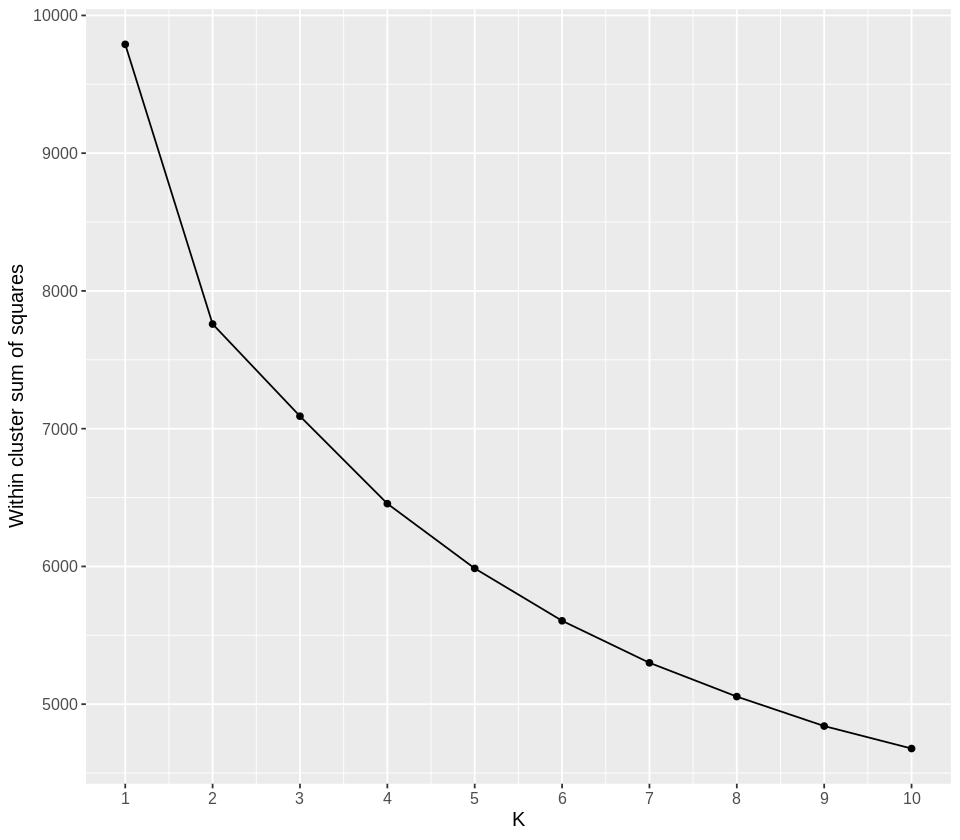

In [30]:
#DON'T CHANGE THIS SEED VALUE
set.seed(2019)

kmeans_recipe <- recipe( ~ ., data = clean_reviews) |>
    step_scale(all_predictors()) |>
    step_center(all_predictors())

tourism_ks <- tibble(num_clusters = 1:10)

kmeans_spec <- k_means(num_clusters = tune()) |>
    set_engine("stats", nstart = 100)

kmeans_results <- workflow() |>
    add_recipe(kmeans_recipe) |>
    add_model(kmeans_spec) |>
    tune_cluster(resample = apparent(clean_reviews), grid = tourism_ks) |>
    collect_metrics()

tourism_elbow_stats <- kmeans_results |>
    filter(.metric == "sse_within_total") |>
    mutate(total_WSSD = mean) |>
    select(num_clusters, total_WSSD)

tourism_elbow_plot <- tourism_elbow_stats |>
    ggplot(aes(x = num_clusters, y = total_WSSD)) +
    geom_point() +
    geom_line() +
    labs(x = "K", y = "Within cluster sum of squares") +
    scale_x_continuous(breaks = 1:10) +
    theme(text = element_text(size = 12)) 

tourism_elbow_plot

In [31]:
test_that('Did not create an object called elbow_stats', {
    expect_true(exists('elbow_stats'))
})
test_that('Did not create a plot called tourism_elbow_plot', {
    expect_true(exists('tourism_elbow_plot'))
})
# The remainder of the tests were intentionally hidden so that you can practice deciding 
# when you have the correct answer.

Test passed 🎊
Test passed 🥳


**Question 2.2** 
<br> {points: 3}

From the elbow plot above, which $k$ should you choose? Explain why you chose that $k$.

I would choose K = 4 as that is where the elbow occurs on the graph.

**Question 2.3**
<br> {points: 3}

Run K-means again, with the optimal $K$, and assign your answer to an object called `reviews_clusters`. Use `nstart = 100`. Then, use the `augment` function to get the cluster assignments for each point. Name the data frame `cluster_assignments`.

In [34]:
#DONT CHANGE THIS SEED VALUE
set.seed(2019)

reviews_clusters <- k_means(num_clusters = 4) |>
    set_engine("stats", nstart = 100)

final_kmeans <- workflow() |>
    add_recipe(kmeans_recipe) |>
    add_model(reviews_clusters) |>
    fit(data = clean_reviews)

cluster_assignments <- augment(final_kmeans, clean_reviews)

cluster_assignments

Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10,.pred_cluster
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
0.93,1.8,2.29,0.62,0.80,2.42,3.19,2.79,1.82,2.42,Cluster_1
1.02,2.2,2.66,0.64,1.42,3.18,3.21,2.63,1.86,2.32,Cluster_1
1.22,0.8,0.54,0.53,0.24,1.54,3.18,2.80,1.31,2.50,Cluster_2
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
0.61,1.32,0.67,0.43,1.30,1.78,3.17,2.81,1.34,3.02,Cluster_2
0.93,0.20,0.13,0.43,0.30,0.40,3.18,2.98,1.12,2.46,Cluster_2
0.93,0.56,1.13,0.51,1.34,2.36,3.18,2.87,1.34,2.40,Cluster_1


For the following 2 questions use the following plot as reference. 

> The visualization below is a density plot, you can think of it as a smoothed version of a histogram. Density plots are more effective for comparing multiple distributions. What we are looking for with these visualizations, is to see which variables have difference distributions between the different clusters.

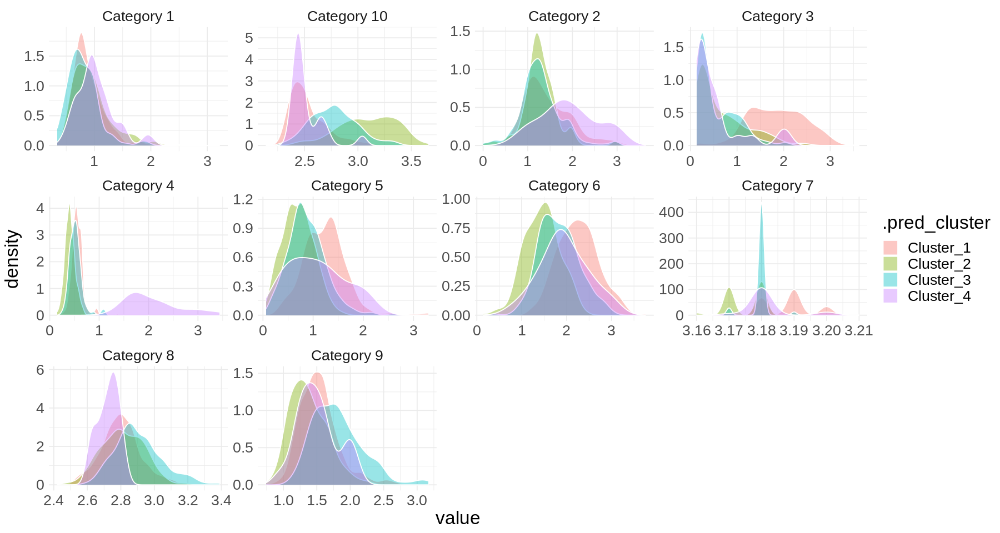

In [37]:
options(repr.plot.height = 8, repr.plot.width = 15)
cluster_assignments |>
    pivot_longer(cols = -.pred_cluster, names_to = 'category', values_to = 'value')  |> 
    ggplot(aes(value, fill = .pred_cluster)) +
        geom_density(alpha = 0.4, colour = 'white') +
        # We are setting the x-scale to "free" since we standardized the rating values before clustering them,
        # which means that their original range (which is what we show here) does not matter
        facet_wrap(facets = vars(category), scales = 'free') +
        theme_minimal() +
        theme(text = element_text(size = 20))

**Question 2.4** Multiple Choice:
<br> {points: 1}

From the plots above, point out the categories that we might hypothesize are driving the clustering? (i.e., are useful to distinguish between the type of tourists?) We list the table of the categories below. 

- Category 1 : Average user feedback on art galleries 
- Category 2 : Average user feedback on dance clubs 
- Category 3 : Average user feedback on juice bars 
- Category 4 : Average user feedback on restaurants 
- Category 5 : Average user feedback on museums 
- Category 6 : Average user feedback on resorts 
- Category 7 : Average user feedback on parks/picnic spots 
- Category 8 : Average user feedback on beaches 
- Category 9 : Average user feedback on theaters 
- Category 10 : Average user feedback on religious institutions

A. 10, 3, 5, 6, 7

B. 10, 3, 5, 6, 1

C. 10, 3, 4, 6, 7

D. 10, 2, 5, 6, 7

*Assign your answer to an object called `answer2.4`. Make sure your answer is an uppercase letter and is surrounded by quotation marks (e.g. `"F"`).*

In [38]:
# your code here
answer2.4 <- "B"

**Question 2.5** 
<br> {points: 3}

Discuss one disadvantage of not being able to visualize the clusters when dealing with multidimensional data.

Not being able to visualize clusters in multidimensional data makes it challenging to understand relationships within the data. In higher-dimensional spaces, the absence of visual cues reduces the ability to interpret the significance of each cluster accurately. 

In [39]:
source("cleanup.R")